In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import itertools
from networkx.algorithms import community
import operator
from itertools import islice

df = pd.read_excel('/Scripts/managers_graph/managers.xlsx')



In [3]:
#creating edge list - two managers have link if they coached the same team
edge_list = []

for index, row in df.iterrows():
    current = row
    current_club = row['Club']
    current_df = df[(df.Club == current_club)]
    arr = np.array(current_df['Manager'])

    for i in range(len(arr)):
        try:
            if current['Manager'] != arr[i]:
                edge_list.append([current['Manager'], arr[i]])
        except: 
            print('e')
            pass




In [4]:
#creating the graph from the edge list
G = nx.Graph()
G.add_edges_from(edge_list)
print('Basic information about the graph:')
print(nx.info(G))


Basic information about the graph:
Name: 
Type: Graph
Number of nodes: 236
Number of edges: 1843
Average degree:  15.6186


In [6]:
#managers with the most and the fewest degrees
degrees = [(node, val) for (node, val) in G.degree()]
degree_table = pd.DataFrame(degrees, columns=['Manager','Degree'])
degree_table.sort_values(by=['Degree'], inplace = True, ascending = False)
degree_table.reset_index(drop=True, inplace=True)
degree_table.index += 1
print('Managers with the most connections:')
print(degree_table[:20])
print()
print('Managers with the fewest connections:')
print(degree_table[-20:])


Managers with the most connections:
              Manager  Degree
1       Sam Allardyce      81
2         Mark Hughes      55
3      Harry Redknapp      53
4        Glenn Hoddle      50
5         Alan Pardew      48
6         Roy Hodgson      47
7      Graeme Souness      45
8     Claudio Ranieri      43
9       Chris Hughton      42
10     Rafael Benítez      41
11        David Moyes      40
12      José Mourinho      39
13        Steve Bruce      38
14     Martin O'Neill      37
15      Nigel Pearson      36
16        Avram Grant      36
17        Ruud Gullit      36
18  Roberto Di Matteo      35
19  André Villas-Boas      34
20    Carlo Ancelotti      33

Managers with the fewest connections:
                 Manager  Degree
217         Eamonn Dolan       3
218    Eddie Niedzwiecki       3
219  Nuno Espírito Santo       3
220          Bobby Gould       3
221             Les Reed       3
222        Stuart McCall       3
223        Jim Jefferies       3
224            Phil Neal       

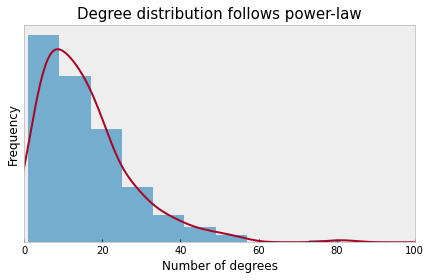

In [8]:
#degree distribution
degree = [G.degree(n) for n in G.nodes()]
degree = pd.DataFrame(degree)
plt.style.use("bmh")
fig, ax = plt.subplots(figsize = (7,4))
degree.plot(ax = ax, kind = 'hist', density = True, alpha = 0.65, bins = 10)
degree.plot(ax = ax, kind = 'kde')
ax.grid(False)
ax.set_xlabel('Number of degrees')
ax.set_xlim(0,100)
ax.set_ylabel('Frequency')
ax.set_yticks([])
ax.get_legend().remove()
ax.set_title('Degree distribution follows power-law', size = 15)

plt.show()


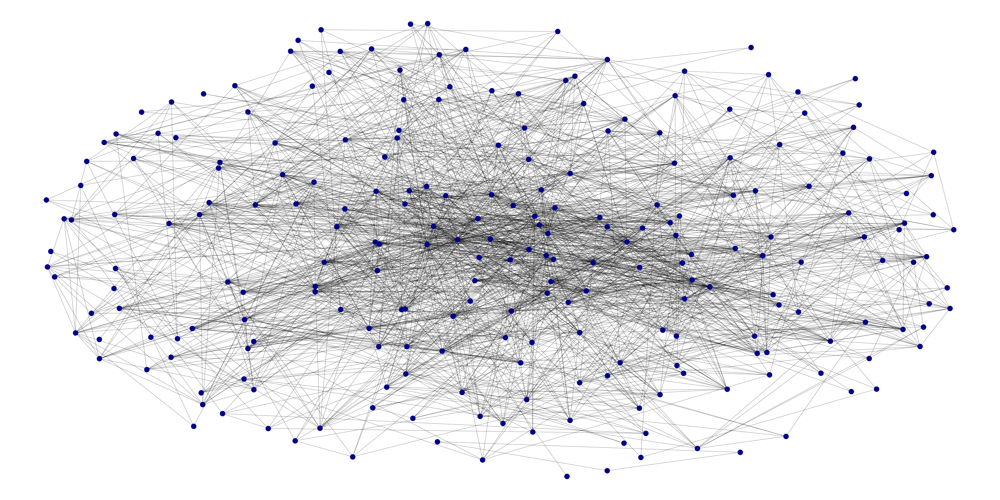

In [10]:
#plot of the network
plt.figure(figsize=(100,50))
pos = nx.spring_layout(G, k=1)
nx.draw(G, pos , with_labels = False, width=1, 
        node_color='darkblue', node_size=1500,
        font_size = 50, font_color = 'darkblue', font_weight = 'bold')


In [11]:
#check if connected
print(f"Is connected?: {nx.is_connected(G)}")

Is connected?: False


In [12]:
#number of components
print(f"Number of components: {nx.number_connected_components(G)}")



Number of components: 3


In [13]:
#delete components to get only 1
for i in range(2):
    components = nx.connected_components(G)
    min_component = min(components, key=len)
    print(f"Deleted component: {min_component}")
    G.remove_nodes_from(list(min_component))

print(f"Is connected?: {nx.is_connected(G)}")


Deleted component: {'David Wagner', 'Jan Siewert', 'Mark Hudson'}
Deleted component: {'John Lyall', 'George Burley', 'Paul Goddard'}
Is connected?: True


In [14]:
#info of the new graph
print('Basic information about the graph:')
print(nx.info(G))

Basic information about the graph:
Name: 
Type: Graph
Number of nodes: 230
Number of edges: 1837
Average degree:  15.9739


In [15]:
#Average shortest path length
spl = nx.average_shortest_path_length(G)
print("Average shortest path length:", spl)

Average shortest path length: 2.5342699829124737


In [16]:
#Network density
density = nx.density(G)
print("Network density:", density)


Network density: 0.0697550787924815


In [17]:
#Diameter
print("Diameter:", nx.diameter(G))

Diameter: 5


In [18]:
#Triadic closure / clustering coefficient
triadic_closure = nx.transitivity(G)
print("Triadic closure:", triadic_closure)

Triadic closure: 0.5467514091531164


In [19]:
#eigenvectors
eigenvector_dict = nx.eigenvector_centrality(G)
eigenvector_table = pd.DataFrame(eigenvector_dict.items())
eigenvector_table.sort_values(by=[1], inplace = True, ascending = False)
eigenvector_table.reset_index(drop=True, inplace=True)
eigenvector_table.index += 1
print('The most important players according to the eigenvectors:')
print(eigenvector_table[:10])


The most important players according to the eigenvectors:
                 0         1
1    Sam Allardyce  0.216783
2     Glenn Hoddle  0.198220
3   Rafael Benítez  0.178342
4   Harry Redknapp  0.172441
5   Graeme Souness  0.169262
6      Ruud Gullit  0.167426
7      Alan Pardew  0.157078
8    Chris Hughton  0.152243
9      Mark Hughes  0.151272
10   José Mourinho  0.148888


In [20]:
#betweenness
betweenness_dict = nx.betweenness_centrality(G)
betweenness_table = pd.DataFrame(betweenness_dict.items())
betweenness_table.sort_values(by=[1], inplace = True, ascending = False)
betweenness_table.reset_index(drop=True, inplace=True)
betweenness_table.index += 1
print('The most important players according to betweenness:')
print(betweenness_table[:10])
#érdekes lehet betweenness és degree összehasonlítés, ki a váratlan, az köthet össze csoportokat



The most important players according to betweenness:
                  0         1
1     Sam Allardyce  0.157863
2    Harry Redknapp  0.070470
3   Brendan Rodgers  0.070440
4     George Graham  0.061193
5       Mark Hughes  0.060306
6     Chris Hughton  0.057975
7       Roy Hodgson  0.050231
8       Steve Bruce  0.048857
9     Nigel Pearson  0.043415
10  Claudio Ranieri  0.040258


In [21]:
#create fexf file from the graph
nx.write_gexf(G, '/PL_Players/pl_managers_network.gexf')



In [23]:
#managers at one club
print("Longest serving managers at one club:")
print(df[['Manager', 'Club']].value_counts()[:20])

Longest serving managers at one club:
Manager              Club             
Arsène Wenger        Arsenal              22
Alex Ferguson        Manchester United    21
David Moyes          Everton              12
José Mourinho        Chelsea               7
Alan Curbishley      Charlton Athletic     7
Sam Allardyce        Bolton Wanderers      6
Rafael Benítez       Liverpool             6
Jürgen Klopp         Liverpool             6
Bobby Robson         Newcastle United      6
Kevin Keegan         Newcastle United      6
Sean Dyche           Burnley               6
Roy Evans            Liverpool             6
Gérard Houllier      Liverpool             6
Mauricio Pochettino  Tottenham Hotspur     6
Harry Redknapp       West Ham United       6
Jim Smith            Derby County          6
Alan Pardew          Newcastle United      5
Steve Bruce          Birmingham City       5
Gordon Strachan      Coventry City         5
Mark Hughes          Stoke City            5
dtype: int64


In [24]:
#managers with the most clubs
print("Managers with the most clubs:")
most_clubs = df[['Manager', 'Club']].groupby("Manager").nunique()
print(most_clubs.sort_values("Club",ascending = False)[:25])

Managers with the most clubs:
                 Club
Manager              
Sam Allardyce       8
Mark Hughes         6
Harry Redknapp      5
Steve Bruce         5
Alan Pardew         5
Roy Hodgson         5
Ron Atkinson        4
Neil Warnock        4
David Moyes         4
Chris Hughton       4
Graeme Souness      4
George Graham       3
Gary Megson         3
Kenny Dalglish      3
Eric Black          3
Paul Jewell         3
Glenn Hoddle        3
Joe Royle           3
Nigel Pearson       3
Paul Lambert        3
Iain Dowie          3
José Mourinho       3
Peter Reid          3
Claudio Ranieri     3
Rafael Benítez      3


In [25]:
#Clubs with the most managers
print("Clubs with the most managers:")
most_man = df[['Club', 'Manager']].groupby('Club').nunique()
print(most_man.sort_values("Manager", ascending = False))

Clubs with the most managers:
                          Manager
Club                             
Chelsea                        21
Southampton                    19
Newcastle United               18
Tottenham Hotspur              17
Aston Villa                    16
West Bromwich Albion           16
Sunderland                     14
Everton                        14
Manchester City                13
Crystal Palace                 13
Leicester City                 13
West Ham United                12
Fulham                         12
Blackburn Rovers               10
Swansea City                    9
Norwich City                    9
Watford                         8
Queens Park Rangers             8
Liverpool                       8
Arsenal                         7
Bolton Wanderers                7
Portsmouth                      7
Middlesbrough                   7
Leeds United                    7
Manchester United               6
Derby County                    6
Nottingham Forest 

In [26]:
#Nationalities with the most managers
print("Nationalities with the most managers:")
most_nat = df[['Nationality', 'Manager']].groupby('Nationality').nunique()
print(most_nat.sort_values("Manager", ascending = False))

Nationalities with the most managers:
                  Manager
Nationality              
England               117
Scotland               31
Italy                  12
Spain                  10
Wales                   9
Netherlands             8
France                  7
Ireland                 7
Northern Ireland        6
Portugal                5
Germany                 5
Argentina               4
Norway                  2
Croatia                 2
Sweden                  2
United States           2
Austria                 1
Israel                  1
Denmark                 1
Chile                   1
Serbia                  1
Brazil                  1
Switzerland             1
Uruguay                 1
Jamaica                 1
